In [2]:
import torchvision
# import argparse
import yaml
import os
from torchvision.utils import make_grid
from tqdm import tqdm
from models.unet_cond_base import Unet
from scheduler.linear_noise_scheduler import LinearNoiseScheduler
from utils.config_utils import *


config_path = 'config/icd2fc_image_cond.yaml'
# Read the config file #
with open(config_path, 'r') as file:
    try:
        config = yaml.safe_load(file)
    except yaml.YAMLError as exc:
        print(exc)
print(config)
########################

diffusion_config = config['diffusion_params']
dataset_config = config['dataset_params']
# dataset_config['im_size'] = 120
diffusion_model_config = config['ldm_params']
autoencoder_model_config = config['autoencoder_params']
train_config = config['train_params']
diffusion_config['num_timesteps'] = 100

########## Create the noise scheduler #############
scheduler = LinearNoiseScheduler(num_timesteps=diffusion_config['num_timesteps'],
                                 beta_start=diffusion_config['beta_start'],
                                 beta_end=diffusion_config['beta_end'])
###############################################

# text_tokenizer = None

############# Validate the config #################
condition_config = get_config_value(diffusion_model_config, key='condition_config', default_value=None)
assert condition_config is not None, ("This sampling script is for text conditional "
                                      "but no conditioning config found")
condition_types = get_config_value(condition_config, 'condition_types', [])
assert 'text' in condition_types, ("This sampling script is for text conditional "
                                    "but no text condition found in config")
validate_text_config(condition_config)
###############################################


{'dataset_params': {'im_path': 'placeholder', 'im_channels': 1, 'im_size': 116, 'name': 'ICDFC'}, 'diffusion_params': {'num_timesteps': 1000, 'beta_start': 0.00085, 'beta_end': 0.012}, 'ldm_params': {'down_channels': [128, 256, 384, 512], 'mid_channels': [512, 384], 'down_sample': [True, True, True], 'attn_down': [True, True, True], 'time_emb_dim': 512, 'norm_channels': 32, 'num_heads': 8, 'conv_out_channels': 128, 'num_down_layers': 1, 'num_mid_layers': 2, 'num_up_layers': 1, 'condition_config': {'condition_types': ['text'], 'text_condition_config': {'text_embed_model': 'clip', 'train_text_embed_model': False, 'text_embed_dim': 512, 'cond_drop_prob': 0.1}, 'image_condition_config': {'image_condition_input_channels': 1, 'image_condition_output_channels': 1, 'image_condition_h': 120, 'image_condition_w': 120, 'cond_drop_prob': 0.1}}}, 'autoencoder_params': {'z_channels': 1, 'codebook_size': 8192, 'down_channels': [64, 128, 256, 256], 'mid_channels': [256, 256], 'down_sample': [True, Tru

## Test every timepoint

In [3]:
from dataset.icdfc_dataset import ICDFCDataset, FCICDDataset
latent_tag = 'DualSPD_thr25'
im_dataset_cls = {
    # 'mnist': MnistDataset,
    # 'celebhq': CelebDataset,
    'ICDFC': ICDFCDataset,
    'FCICD': FCICDDataset,
}.get(dataset_config['name'])

im_dataset = im_dataset_cls(split='val', preload_embed=True, device='cuda:1', skip_future=False,
                            im_path=dataset_config['im_path'],
                            im_size=dataset_config['im_size'],
                            im_channels=dataset_config['im_channels'],
                            use_latents=True,
                            latent_path=os.path.join(train_config['task_name'],
                                                     latent_tag+train_config['vqvae_latent_dir_name']),
                            condition_config=condition_config)
im_dataset[0]

['hariri', 'rest']


prepare data list: 100%|████████████████| 19930/19930 [00:05<00:00, 3954.90it/s]


Found 4485 latents


(tensor([[ 0.4057,  0.2827, -0.4465,  ..., -0.4178,  1.0191,  2.0300],
         [-0.0694,  0.5364,  0.5190,  ...,  0.9599,  0.5499, -0.7020],
         [ 0.6433, -0.0055, -0.5454,  ...,  0.4601, -1.1985,  0.7392],
         ...,
         [ 0.2725, -0.4454, -0.1240,  ..., -0.1111, -0.9159,  0.9022],
         [ 0.4831,  1.4693, -0.7733,  ...,  0.0618,  0.3584,  0.3020],
         [ 0.4831,  1.4693, -0.7733,  ...,  0.0618,  0.3584,  0.3020]]),
 {'text': tensor([[-0.6624, -0.3551,  0.5985,  ...,  0.7360, -1.8557, -0.9571],
          [-0.8733, -0.1472,  0.7104,  ...,  0.8140, -2.0123, -0.5302],
          [-0.9011, -0.0425,  0.6464,  ...,  0.7671, -1.9657, -0.5059],
          ...,
          [ 0.2396, -1.7983,  1.1800,  ..., -0.7613, -1.1136, -0.3923],
          [ 0.2396, -1.7983,  1.1800,  ..., -0.7613, -1.1136, -0.3923],
          [ 0.2396, -1.7983,  1.1800,  ..., -0.7613, -1.1136, -0.3923]])})

In [6]:
import torch
train_label = torch.load('ntp_text_embed_train.pth')
train_label.keys()

dict_keys(['text_embed', 'data_id', 'next_disease', 'text_cond'])

In [7]:

val_label = torch.load('ntp_text_embed_val.pth')
val_label.keys()

dict_keys(['text_embed', 'data_id', 'next_disease', 'text_cond'])

In [16]:

im_dataset = im_dataset_cls(split='train', preload_embed=True, device='cuda:1', skip_future=False,
                            im_path=dataset_config['im_path'],
                            im_size=dataset_config['im_size'],
                            im_channels=dataset_config['im_channels'],
                            use_latents=True,
                            latent_path=os.path.join(train_config['task_name'],
                                                     latent_tag+train_config['vqvae_latent_dir_name']),
                            condition_config=condition_config)
torch.save({'next_disease': train_label['next_disease'], 'gt_img': torch.stack(im_dataset.images)[train_label['data_id']]}, 'ntp_real-fc_train.pth')


['hariri', 'rest']


prepare data list: 100%|████████████████| 19930/19930 [00:13<00:00, 1456.79it/s]


Found 17932 latents


In [17]:

im_dataset = im_dataset_cls(split='val', preload_embed=True, device='cuda:1', skip_future=False,
                            im_path=dataset_config['im_path'],
                            im_size=dataset_config['im_size'],
                            im_channels=dataset_config['im_channels'],
                            use_latents=True,
                            latent_path=os.path.join(train_config['task_name'],
                                                     latent_tag+train_config['vqvae_latent_dir_name']),
                            condition_config=condition_config)
torch.save({'next_disease': val_label['next_disease'], 'gt_img': torch.stack(im_dataset.images)[val_label['data_id']]}, 'ntp_real-fc_val.pth')

['hariri', 'rest']


prepare data list: 100%|████████████████| 19930/19930 [00:04<00:00, 3990.25it/s]


Found 4485 latents


In [3]:
from transformers import Qwen3ForCausalLM
from dataset.icdfc_dataset import tokenize, get_text_representation
device = 'cuda:1'
text_model = Qwen3ForCausalLM.from_pretrained('icd10_tokenizer_posid/qwen-icd10-complete/best_model').to(device)
text_model.eval()

Qwen3ForCausalLM(
  (model): Qwen3Model(
    (embed_tokens): Embedding(1945, 512)
    (layers): ModuleList(
      (0-11): 12 x Qwen3DecoderLayer(
        (self_attn): Qwen3Attention(
          (q_proj): Linear(in_features=512, out_features=1024, bias=False)
          (k_proj): Linear(in_features=512, out_features=1024, bias=False)
          (v_proj): Linear(in_features=512, out_features=1024, bias=False)
          (o_proj): Linear(in_features=1024, out_features=512, bias=False)
          (q_norm): Qwen3RMSNorm((128,), eps=1e-06)
          (k_norm): Qwen3RMSNorm((128,), eps=1e-06)
        )
        (mlp): Qwen3MLP(
          (gate_proj): Linear(in_features=512, out_features=5504, bias=False)
          (up_proj): Linear(in_features=512, out_features=5504, bias=False)
          (down_proj): Linear(in_features=5504, out_features=512, bias=False)
          (act_fn): SiLUActivation()
        )
        (input_layernorm): Qwen3RMSNorm((512,), eps=1e-06)
        (post_attention_layernorm): Qwen

In [20]:
def make_batch(txtlist):
    batch = []
    dataids = []
    labels = []
    for datai, txt in enumerate(txtlist):
        txt = txt[0]
        candidate_txt = []
        label = []
        dataid = []
        disease_count = 0
        for i, item in enumerate(txt.split(' ')):
            if item != 'CN' and item not in ['<|startoftext|>', '<|endoftext|>']:
                if disease_count > 0: 
                    candidate_txt.append(' '.join(txt.split(' ')[:i]))
                    label.append(item.split('-')[0])
                    dataid.append(datai)
                disease_count += 1
        batch.extend(candidate_txt)
        labels.extend(label)
        dataids.extend(dataid)
    return batch, labels, dataids

In [21]:
from tqdm import trange
import torch
dataids = []
bsz = 100
# for txt in tqdm(self.texts, desc='Preload text embed'):
for txti in trange(0, len(im_dataset.texts), bsz, desc='Preload text embed'):
    _, _, dataid = make_batch(im_dataset.texts[txti:txti+bsz])
    dataids.extend(dataid)

Preload text embed: 100%|██████████████████████| 45/45 [00:00<00:00, 406.51it/s]


In [5]:
from tqdm import trange
import torch
all_text_embed = []
batches = []
nextdiseases = []
bsz = 100
# for txt in tqdm(self.texts, desc='Preload text embed'):
for txti in trange(0, len(im_dataset.texts), bsz, desc='Preload text embed'):
    batch, label = make_batch(im_dataset.texts[txti:txti+bsz])
    batches.extend(batch)
    nextdiseases.extend(label)
    # continue
    with torch.no_grad():        
        text_condition = get_text_representation(batch, tokenize, text_model, device, max_length=text_model.config.max_position_embeddings).cpu()

    all_text_embed.extend(text_condition)

Preload text embed:   0%|                                | 0/45 [00:00<?, ?it/s]/ram/USERS/ziquanw/StableDiffusion-PyTorch/dataset/icdfc_dataset.py:53: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tokens_tensor = torch.tensor(indexed_tokens).to(device)
/ram/USERS/ziquanw/StableDiffusion-PyTorch/dataset/icdfc_dataset.py:54: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  mask_tensor = torch.tensor(att_masks).to(device)
/ram/USERS/ziquanw/StableDiffusion-PyTorch/dataset/icdfc_dataset.py:55: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.detach().clone() or sourceTensor.detach().clone().requires_grad_(True), rather than torch.tensor(sourceTensor).
  seq_p

In [22]:
len(batches), len(dataids)

(10709, 10709)

In [ ]:
torch.save({'text_embed': torch.stack(all_text_embed).detach().cpu(), 'data_id': dataids, 'next_disease': nextdiseases, 'text_cond': batches}, 'ntp_text_embed_val.pth')

In [10]:
batches[:10]

['<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN S86-X50 CN CN',
 '<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN S86-X50 CN CN I44 CN CN CN CN CN CN',
 '<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN S86-X50 CN CN I44 CN CN CN CN CN CN D25-M17',
 '<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN S86-X50 CN CN I44 CN CN CN CN CN CN D25-M17 M23 CN CN CN CN CN CN',
 '<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN S86-X50 CN CN I44 CN CN CN CN CN CN D25-M17 M23 CN CN CN CN CN CN H26-Z87 CN CN CN',
 '<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN L72 CN CN CN CN',
 '<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN L72 CN CN CN CN R07 CN',
 '<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN L72 CN CN CN CN R07 CN H25-Q18-Z86-Z92 CN',
 '<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN L72 CN CN CN CN R0

In [11]:
from models.cholesky_ddpm import LatentMLPDiffusion
import torch
model = LatentMLPDiffusion(model_config=diffusion_model_config, input_shape=[256+16,256]).to(device)
model.eval()
latent_tag = 'DualSPD_thr25'
model.load_state_dict(torch.load(f'icd2fc/best_{latent_tag}vqvae_ddpm_ckpt_text_image_cond_clip.pth'))
from models.vqvae import VQVAE, SPD_VQVAE
autoencoder_config = config['autoencoder_params']
from torchvision.utils import make_grid
latent_tag = 'DualSPD_thr25'
model1 = SPD_VQVAE(input_dim=116,
                      model_config=autoencoder_config,
                   num_latents=256,).to(device)
model1.load_state_dict(torch.load('icd2fc/DualSPD_thr25_m1vqvae_autoencoder_ckpt.pth',
                                 map_location=device))

model2 = SPD_VQVAE(input_dim=116,
                  model_config=autoencoder_config,
                   num_latents=16, # 
                   codebook_size=16 # 
                  ).to(device)
model2.load_state_dict(torch.load('icd2fc/DualSPD_thr25_m2vqvae_autoencoder_ckpt.pth',
                                 map_location=device))
model1.eval()
model2.eval()


SPD_VQVAE(
  (encoder_body): Sequential(
    (0): Linear(in_features=13456, out_features=512, bias=True)
    (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): SiLU()
    (3): Linear(in_features=512, out_features=256, bias=True)
    (4): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): SiLU()
    (6): Linear(in_features=256, out_features=128, bias=True)
    (7): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): SiLU()
  )
  (encoder_out): Linear(in_features=128, out_features=4096, bias=True)
  (embedding): Embedding(16, 256)
  (decoder_body): Sequential(
    (0): Linear(in_features=4096, out_features=128, bias=True)
    (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): SiLU()
    (3): Linear(in_features=128, out_features=256, bias=True)
    (4): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats

In [12]:

def reverse_decomp(comp1, comp2):
    n = comp1.shape[-1]
    batch_mat = torch.zeros(len(comp1), n, n)
    tril_idx = torch.tril_indices(n, n)
    triu_idx = torch.triu_indices(n, n)
    batch_mat[:, tril_idx[0], tril_idx[1]] = torch.fft.irfft(torch.fft.rfft(comp1[:, tril_idx[0], tril_idx[1]], dim=-1) + torch.fft.rfft(comp2[:, tril_idx[0], tril_idx[1]], dim=-1), n=tril_idx.shape[-1], dim=-1).detach().cpu()
    batch_mat[:, triu_idx[0], triu_idx[1]] = batch_mat[:, triu_idx[1], triu_idx[0]]
    return batch_mat
    

In [14]:
all_text_embed[0].device

device(type='cpu')

In [16]:
pred_zs = []
all_decoded_output1 = []
all_decoded_output2 = []
bsz = 128
for batchi in range(0, len(all_text_embed), bsz):
    cond_input = {'text': torch.stack(all_text_embed[batchi:batchi+bsz])}
    ########### Sample random noise latent ##########
    # For not fixing generation with one sample
    xt = torch.randn((len(cond_input['text']),
                      256+16,
                      256)).to(device)
    ###############################################
    cond_input['text'] = cond_input['text'].to(device)

    ################# Sampling Loop ########################
    with torch.no_grad():
        for i in tqdm(reversed(range(diffusion_config['num_timesteps'])), desc=f'batch {batchi}'):
            # Get prediction of noise
            t = (torch.ones((xt.shape[0],)) * i).long().to(device)
            noise_pred_cond = model(xt, t, cond_input=cond_input)
            noise_pred = noise_pred_cond
            
            # Use scheduler to get x0 and xt-1
            xt, x0_pred = scheduler.sample_prev_timestep(xt, noise_pred, torch.as_tensor(i).to(device), spd=False)
            
            # Save x0
            if i == 0:
                # Decode ONLY the final image to save time
                ims = xt
            else:
                ims = x0_pred
            
            pred_z = ims

    pred_zs.append(pred_z.detach().cpu())
    with torch.no_grad():
        all_decoded_output1.append(model1.decode(pred_z[:, :256])[0].detach().cpu().squeeze())
        all_decoded_output2.append(model2.decode(pred_z[:, 256:])[0].detach().cpu().squeeze())
        

all_decoded_output1 = torch.cat(all_decoded_output1)
all_decoded_output2 = torch.cat(all_decoded_output2)
pred_zs = torch.cat(pred_zs)

batch 0: 100it [01:41,  1.02s/it]
batch 128: 100it [01:43,  1.04s/it]
batch 256: 100it [01:43,  1.03s/it]
batch 384: 100it [01:44,  1.05s/it]
batch 512: 100it [01:44,  1.05s/it]
batch 640: 100it [01:44,  1.05s/it]
batch 768: 100it [01:44,  1.04s/it]
batch 896: 100it [01:44,  1.04s/it]
batch 1024: 100it [01:44,  1.04s/it]
batch 1152: 100it [01:44,  1.04s/it]
batch 1280: 100it [01:42,  1.03s/it]
batch 1408: 100it [01:42,  1.03s/it]
batch 1536: 100it [01:42,  1.03s/it]
batch 1664: 100it [01:42,  1.03s/it]
batch 1792: 100it [01:43,  1.03s/it]
batch 1920: 100it [01:43,  1.04s/it]
batch 2048: 100it [01:44,  1.04s/it]
batch 2176: 100it [01:43,  1.04s/it]
batch 2304: 100it [01:44,  1.04s/it]
batch 2432: 100it [01:45,  1.05s/it]
batch 2560: 100it [01:44,  1.04s/it]
batch 2688: 100it [01:44,  1.05s/it]
batch 2816: 100it [01:43,  1.03s/it]
batch 2944: 100it [01:41,  1.01s/it]
batch 3072: 100it [01:42,  1.02s/it]
batch 3200: 100it [01:42,  1.02s/it]
batch 3328: 100it [01:42,  1.03s/it]
batch 3456:

In [17]:
pred_zs.shape

torch.Size([10709, 272, 256])

In [18]:
all_decoded_output = reverse_decomp(all_decoded_output1.squeeze(), all_decoded_output2.squeeze()).clamp(-1., 1.)
all_decoded_output[:, torch.arange(all_decoded_output.shape[-1]), torch.arange(all_decoded_output.shape[-1])] = 1
all_decoded_output.shape

torch.Size([10709, 116, 116])

In [19]:
torch.save(
    {'pred_zs': pred_zs.detach().cpu (), 
     'gen_img': all_decoded_output.detach().cpu(), 
    }, 'ntp_gen-fc_val.pth') 

['I44', 'D25', 'M23', 'H26', 'F41', 'R07', 'H25', 'E78', 'M10', 'A09', 'C44', 'R91', 'E16', 'H02', 'E78', 'E78', 'E11', 'K44', 'K57', 'E11', 'H53', 'E78', 'M43', 'M23', 'C44', 'C44', 'E03', 'E03', 'E78', 'K21', 'D12', 'I10', 'I48', 'I50', 'H26', 'R31', 'E78', 'K30', 'K63', 'K80', 'K29', 'J45', 'E66', 'J38', 'M75', 'D12', 'F41', 'H26', 'K21', 'F32'] [0, 0, 0, 0, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 3, 3, 3, 3, 3, 3, 4, 4, 4, 5, 6, 14, 14, 14, 17, 17, 17, 17, 18, 18, 21, 21, 21, 21, 21, 21, 22, 22, 22, 22, 22, 25, 25]


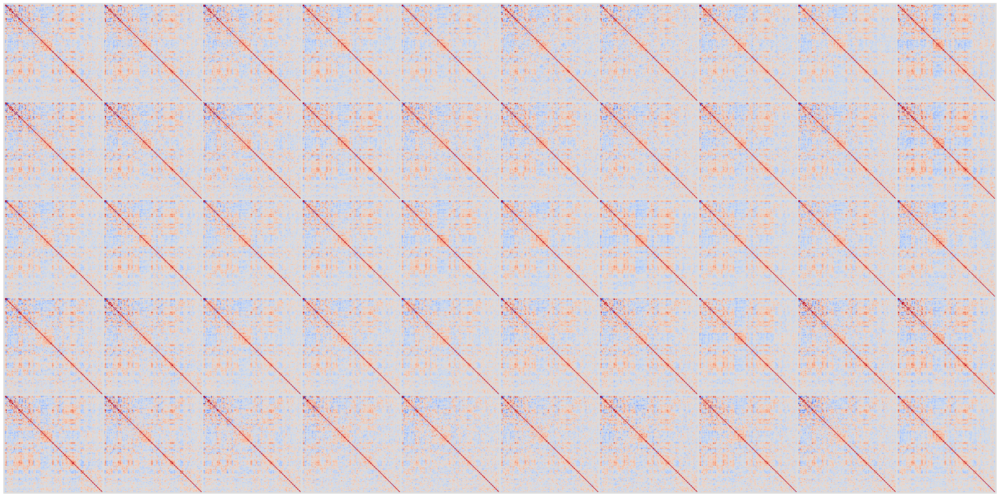

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns
num_samples = 50
print(nextdiseases[:num_samples], dataids[:num_samples])
grid = make_grid(all_decoded_output[:num_samples, None], nrow=10)
plt.figure(figsize=(30,15))
sns.heatmap(grid[0], cmap='coolwarm', vmax=1, vmin=-1, cbar=False)
plt.xticks([])
plt.yticks([])
plt.tight_layout()

## LDM = SPD-VQVAE + DM

In [3]:
from dataset.icdfc_dataset import ICDFCDataset, FCICDDataset
latent_tag = 'DualSPD_thr25'
im_dataset_cls = {
    # 'mnist': MnistDataset,
    # 'celebhq': CelebDataset,
    'ICDFC': ICDFCDataset,
    'FCICD': FCICDDataset,
}.get(dataset_config['name'])

im_dataset = im_dataset_cls(split='val', preload_embed=True, device='cuda:1', compute_textembed=True, skip_future=False,
                            im_path=dataset_config['im_path'],
                            im_size=dataset_config['im_size'],
                            im_channels=dataset_config['im_channels'],
                            use_latents=True,
                            latent_path=os.path.join(train_config['task_name'],
                                                     latent_tag+train_config['vqvae_latent_dir_name']),
                            condition_config=condition_config)
im_dataset[0]

['hariri', 'rest']


prepare data list: 100%|████████████████| 19930/19930 [00:03<00:00, 5433.45it/s]


Found 4485 latents


(tensor([[ 0.4057,  0.2827, -0.4465,  ..., -0.4178,  1.0191,  2.0300],
         [-0.0694,  0.5364,  0.5190,  ...,  0.9599,  0.5499, -0.7020],
         [ 0.6433, -0.0055, -0.5454,  ...,  0.4601, -1.1985,  0.7392],
         ...,
         [ 0.2725, -0.4454, -0.1240,  ..., -0.1111, -0.9159,  0.9022],
         [ 0.4831,  1.4693, -0.7733,  ...,  0.0618,  0.3584,  0.3020],
         [ 0.4831,  1.4693, -0.7733,  ...,  0.0618,  0.3584,  0.3020]]),
 {'text': tensor([[-0.6624, -0.3551,  0.5985,  ...,  0.7360, -1.8557, -0.9571],
          [-0.8733, -0.1472,  0.7104,  ...,  0.8140, -2.0123, -0.5302],
          [-0.9011, -0.0425,  0.6464,  ...,  0.7671, -1.9657, -0.5059],
          ...,
          [ 0.2396, -1.7983,  1.1800,  ..., -0.7613, -1.1136, -0.3923],
          [ 0.2396, -1.7983,  1.1800,  ..., -0.7613, -1.1136, -0.3923],
          [ 0.2396, -1.7983,  1.1800,  ..., -0.7613, -1.1136, -0.3923]])})

In [13]:
im_dataset.text_embed[5][-4:]

tensor([[ 0.0975, -2.1291,  1.1846,  ..., -0.6325, -0.4494, -0.4504],
        [ 0.0975, -2.1291,  1.1846,  ..., -0.6325, -0.4494, -0.4504],
        [ 0.0975, -2.1291,  1.1846,  ..., -0.6325, -0.4494, -0.4504],
        [ 0.0975, -2.1291,  1.1846,  ..., -0.6325, -0.4494, -0.4504]])

In [33]:
from torch.utils.data.dataloader import DataLoader

data_loader = DataLoader(im_dataset,
                         batch_size=train_config['ldm_batch_size'],
                         shuffle=False)

In [34]:
for i, data in enumerate(data_loader):
    im, cond = data
    print(im.shape, cond['text'].shape)
    break
    # im_dataset.texts[0]

torch.Size([128, 272, 256]) torch.Size([128, 300, 512])


In [4]:
device = 'cuda:5'

In [5]:
from models.cholesky_ddpm import LatentMLPDiffusion
import torch
model = LatentMLPDiffusion(model_config=diffusion_model_config, input_shape=[256+16,256]).to(device)
model.eval()
# model.load_state_dict({k.replace('module.', ''): v for k,v in torch.load('icd2fc/best_ddpm_ckpt_text_image_cond_clip.pth').items()})
# model.load_state_dict(torch.load('icd2fc/best_vqvae_ddpm_ckpt_text_image_cond_clip.pth'))
model.load_state_dict(torch.load(f'icd2fc/best_{latent_tag}vqvae_ddpm_ckpt_text_image_cond_clip.pth'))


<All keys matched successfully>

In [6]:
from models.vqvae import VQVAE, SPD_VQVAE
autoencoder_config = config['autoencoder_params']
from torchvision.utils import make_grid
latent_tag = 'DualSPD_thr25'
model1 = SPD_VQVAE(input_dim=116,
                      model_config=autoencoder_config,
                   num_latents=256,).to(device)
model1.load_state_dict(torch.load('icd2fc/DualSPD_thr25_m1vqvae_autoencoder_ckpt.pth',
                                 map_location=device))

model2 = SPD_VQVAE(input_dim=116,
                  model_config=autoencoder_config,
                   num_latents=16, # 
                   codebook_size=16 # 
                  ).to(device)
model2.load_state_dict(torch.load('icd2fc/DualSPD_thr25_m2vqvae_autoencoder_ckpt.pth',
                                 map_location=device))
model1.eval()
model2.eval()


SPD_VQVAE(
  (encoder_body): Sequential(
    (0): Linear(in_features=13456, out_features=512, bias=True)
    (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): SiLU()
    (3): Linear(in_features=512, out_features=256, bias=True)
    (4): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): SiLU()
    (6): Linear(in_features=256, out_features=128, bias=True)
    (7): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): SiLU()
  )
  (encoder_out): Linear(in_features=128, out_features=4096, bias=True)
  (embedding): Embedding(16, 256)
  (decoder_body): Sequential(
    (0): Linear(in_features=4096, out_features=128, bias=True)
    (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): SiLU()
    (3): Linear(in_features=128, out_features=256, bias=True)
    (4): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats

In [26]:

def reverse_decomp(comp1, comp2):
    n = comp1.shape[-1]
    batch_mat = torch.zeros(len(comp1), n, n)
    tril_idx = torch.tril_indices(n, n)
    triu_idx = torch.triu_indices(n, n)
    batch_mat[:, tril_idx[0], tril_idx[1]] = torch.fft.irfft(torch.fft.rfft(comp1[:, tril_idx[0], tril_idx[1]], dim=-1) + torch.fft.rfft(comp2[:, tril_idx[0], tril_idx[1]], dim=-1), n=tril_idx.shape[-1], dim=-1).detach().cpu()
    batch_mat[:, triu_idx[0], triu_idx[1]] = batch_mat[:, triu_idx[1], triu_idx[0]]
    return batch_mat
    

In [36]:
i=0
bsz=128
im_dataset.texts[i*bsz:(i+1)*bsz]

[['<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN S86-X50 CN CN I44 CN CN CN CN CN CN D25-M17 M23 CN CN CN CN CN CN H26-Z87 CN'],
 ['<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN L72 CN CN CN CN R07 CN H25-Q18-Z86-Z92 CN E78-G56 CN CN M10 CN CN A09-E86-G93-H53-I10-I95-N17-R29-R51-R79-R94-Y52-Z86-Z92 C44-E11-F10-F10-F10-F32-H34-J98-K31-K70-K76-K92-R45-T39-T51-X60-X65-Y44 R91-S01-S09-W10 E16-E87-I26-K92-R13-R68 CN'],
 ['<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN N32-N40 CN CN CN CN CN CN CN CN E78-M75-N32-Y83 CN'],
 ['<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN H26 CN CN CN CN CN CN CN CN K44 K57 CN CN CN CN CN CN CN E11-K21-M19-Q66-Z88'],
 ['<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN A09 CN CN CN CN M23 CN CN CN C44-I84-K44 CN CN CN CN CN CN CN CN'],
 ['<|

In [37]:
import random
# gt_zs = []
pred_zs = []
all_zs = []
# decoded_gtzs = []
# gt_ims = []
# decoded_ims = []
all_decoded_output1 = []
all_decoded_output2 = []
# datailist = list(range(len(im_dataset)))
bsz = 128
# for data in data_loader:
for i, data in enumerate(data_loader):
    im, cond_input = data
    im_dataset.texts[i*bsz:(i+1)*bsz]
    ########### Sample random noise latent ##########
    # For not fixing generation with one sample
    xt = torch.randn((im.shape[0],
                      im.shape[1],
                      im.shape[2])).to(device)
    ###############################################
    cond_input['text'] = cond_input['text'].to(device)

    ################# Sampling Loop ########################
    all_ims = []
    with torch.no_grad():
        for i in tqdm(reversed(range(diffusion_config['num_timesteps'])), desc=f'data {datai}'):
            # Get prediction of noise
            t = (torch.ones((xt.shape[0],)) * i).long().to(device)
            noise_pred_cond = model(xt, t, cond_input=cond_input)
            
            # if cf_guidance_scale > 1:
            #     noise_pred_uncond = model(xt, t, uncond_input)
            #     noise_pred = noise_pred_uncond + cf_guidance_scale * (noise_pred_cond - noise_pred_uncond)
            # else:
            noise_pred = noise_pred_cond
            
            # Use scheduler to get x0 and xt-1
            xt, x0_pred = scheduler.sample_prev_timestep(xt, noise_pred, torch.as_tensor(i).to(device), spd=False)
            
            # Save x0
            if i == 0:
                # Decode ONLY the final image to save time
                ims = xt
            else:
                ims = x0_pred
            
            # ims = torch.clamp(ims, -1., 1.).detach().cpu()
            # ims = (ims + 1) / 2
            all_ims.append(ims)

    pred_z = all_ims[-1]
    all_zs.append(torch.stack(all_ims, 1).detach().cpu())
    pred_zs.append(pred_z.detach().cpu()) # gt z
    with torch.no_grad():
        all_decoded_output1.append(model1.decode(pred_z[:, :256])[0].detach().cpu().squeeze())
        all_decoded_output2.append(model2.decode(pred_z[:, 256:])[0].detach().cpu().squeeze())
        

all_decoded_output1 = torch.cat(all_decoded_output1)
all_decoded_output2 = torch.cat(all_decoded_output2)
all_zs = torch.cat(all_zs)
pred_zs = torch.cat(pred_zs)

data 0: 100it [01:33,  1.07it/s]
data 0: 100it [01:37,  1.03it/s]
data 0: 100it [01:37,  1.03it/s]
data 0: 100it [01:37,  1.03it/s]
data 0: 100it [01:37,  1.03it/s]
data 0: 100it [01:37,  1.03it/s]
data 0: 100it [01:37,  1.02it/s]
data 0: 100it [01:37,  1.03it/s]
data 0: 100it [01:37,  1.02it/s]
data 0: 100it [01:37,  1.03it/s]
data 0: 100it [01:37,  1.03it/s]
data 0: 100it [01:37,  1.03it/s]
data 0: 100it [01:37,  1.02it/s]
data 0: 100it [01:37,  1.03it/s]
data 0: 100it [01:37,  1.03it/s]
data 0: 100it [01:36,  1.03it/s]
data 0: 100it [01:37,  1.03it/s]
data 0: 100it [01:37,  1.02it/s]
data 0: 100it [01:37,  1.03it/s]
data 0: 100it [01:37,  1.02it/s]
data 0: 100it [01:37,  1.03it/s]
data 0: 100it [01:37,  1.02it/s]
data 0: 100it [01:37,  1.03it/s]
data 0: 100it [01:37,  1.02it/s]
data 0: 100it [01:37,  1.02it/s]
data 0: 100it [01:37,  1.02it/s]
data 0: 100it [01:37,  1.02it/s]
data 0: 100it [01:37,  1.02it/s]
data 0: 100it [01:37,  1.02it/s]
data 0: 100it [01:37,  1.02it/s]
data 0: 10

In [42]:
all_zs.shape, pred_zs.shape, torch.stack(im_dataset.images).shape, len(im_dataset.texts)

(torch.Size([4485, 100, 272, 256]),
 torch.Size([4485, 272, 256]),
 torch.Size([4485, 116, 116]),
 4485)

In [39]:
all_decoded_output = reverse_decomp(all_decoded_output1.squeeze(), all_decoded_output2.squeeze()).clamp(-1., 1.)
all_decoded_output[:, torch.arange(all_decoded_output.shape[-1]), torch.arange(all_decoded_output.shape[-1])] = 1
all_decoded_output.shape

torch.Size([4485, 116, 116])

In [43]:
torch.save({'all_pred_zs': all_zs, 'pred_zs': pred_zs, 'gen_img': all_decoded_output, 'gt_img': torch.stack(im_dataset.images), 'cond': im_dataset.texts}, 'gen_results_choleskldm.pth')

In [23]:
all_decoded_output1 = [] 
all_decoded_output2 = []
with torch.no_grad():
    all_decoded_output1.append(model1.decode(pred_z[:, :256])[0].detach().cpu().squeeze())
    all_decoded_output2.append(model2.decode(pred_z[:, 256:])[0].detach().cpu().squeeze())
    

torch.Size([128, 116, 116])

In [134]:
pred_list = decoded_ims.squeeze()
torch.save(pred_list, 'gen_fc_spd-vqvae-single.pth')

In [133]:
gt_ims.shape

torch.Size([4485, 116, 116])

In [137]:
import numpy as np
mse = np.mean(((gt_ims - pred_list) ** 2).reshape(len(gt_ims), -1).numpy(), axis=-1)
rmse = np.sqrt(mse)
mse.mean(), rmse.mean(), mse.std(), rmse.std()

(np.float32(0.049546774),
 np.float32(0.21991795),
 np.float32(0.020778583),
 np.float32(0.03439283))

In [139]:
cc = torch.corrcoef(torch.cat([gt_ims.reshape(len(gt_ims), -1), pred_list.reshape(len(gt_ims), -1)]))
all_cc = cc[torch.arange(len(gt_ims)), torch.arange(len(gt_ims))+len(gt_ims)]
all_cc.mean(), all_cc.std()

(tensor(0.6771), tensor(0.0770))

In [143]:
acc = (((gt_ims>0.5).long() == (pred_list>0.5).long()).sum(-1).sum(-1).float())/(116**2)
acc.mean(), acc.std()

(tensor(0.9571), tensor(0.0184))

In [ ]:
accs = []
for thr in range(5,10):
    thr /= 10
    acc = (((gt_ims>thr).long() == (pred_list>thr).long()).sum(-1).sum(-1).float())/(116**2)
    accs.append([acc.mean(), acc.std()])
np.array(accs).mean(0)

In [ ]:
from scipy.stats import wasserstein_distance_nd
wasserstein_distance_nd(gt_ims.reshape(len(gt_ims), -1), pred_list.reshape(len(gt_ims), -1))

In [1]:
gt_ims.shape

NameError: name 'gt_ims' is not defined

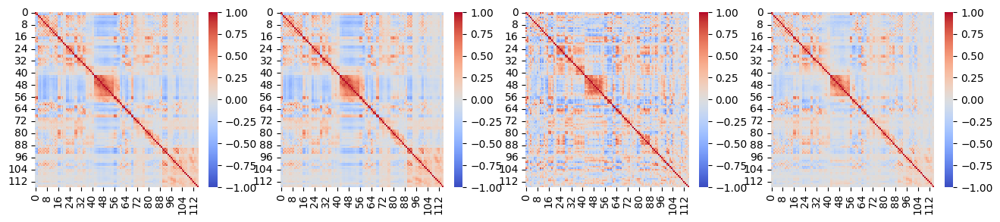

In [116]:
import matplotlib.pyplot as plt
import seaborn as sns
fig, axes = plt.subplots(1, 4, figsize=(16,3))
with torch.no_grad():
    sns.heatmap(vae.decode(vae.quantize(pred_z[None])[0])[0].detach().cpu().squeeze(), ax=axes[0], cmap='coolwarm', vmin=-1, vmax=1)
    sns.heatmap(vae.decode(pred_z[None])[0].detach().cpu().squeeze(), ax=axes[1], cmap='coolwarm', vmin=-1, vmax=1)
    sns.heatmap(im_dataset.images[datai].squeeze(), ax=axes[2], cmap='coolwarm', vmin=-1, vmax=1)
    sns.heatmap(vae(im_dataset.images[datai][None].to(device))[0].detach().cpu().squeeze(), ax=axes[3], cmap='coolwarm', vmin=-1, vmax=1)



In [117]:
decoded_ims = decoded_ims.squeeze()
decoded_gtzs = decoded_gtzs.squeeze()
gt_zs = gt_zs.squeeze()

In [13]:
pred_zs = torch.stack(pred_zs)

In [144]:
idxs = np.array([2610, 2583,  154, 2454, 2035, 1918, 1223,   55, 2603, 1786,  490,
        237, 2698, 3422,  388, 1764, 2178,  805, 2622, 2262, 3408,  824,
       2243, 3210, 1291, 1326, 3406, 1335, 1340, 3569, 3236,  909, 2742,
       1663,  961, 3545,  812,  237,  918, 2045,  133,  221, 3516, 3057,
        874, 2545, 1074, 1286,  954, 3251])

ERROR! Session/line number was not unique in database. History logging moved to new session 688


In [151]:
idxs = [datailist.index(i) for i in idxs]

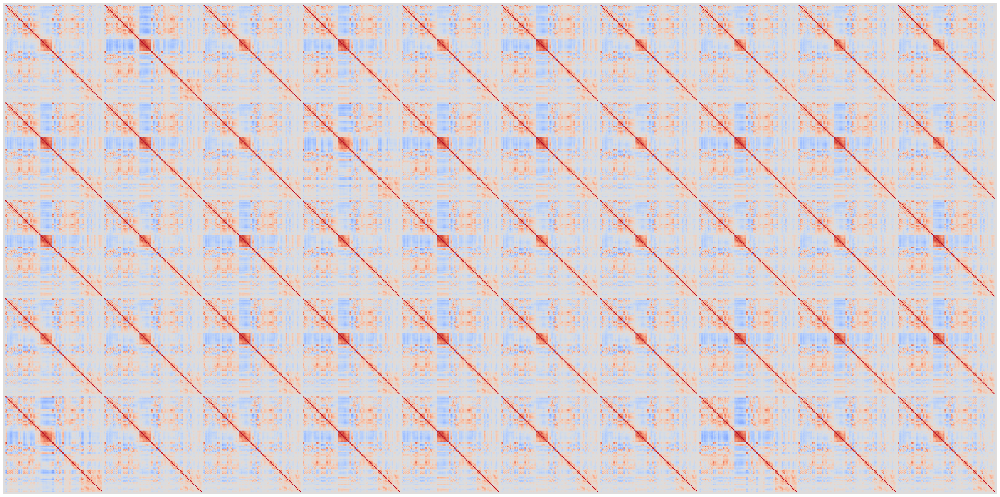

In [153]:
grid = make_grid(pred_list[idxs, None], nrow=10)
plt.figure(figsize=(30,15))
sns.heatmap(grid[0], cmap='coolwarm', vmax=1, vmin=-1, cbar=False)
plt.xticks([])
plt.yticks([])
plt.tight_layout()

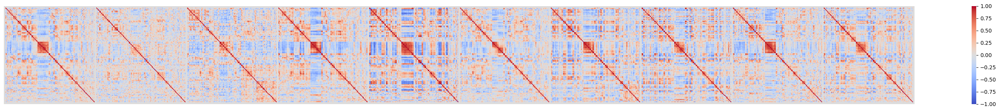

In [118]:
grid = make_grid(gt_ims[:, None], nrow=10)
plt.figure(figsize=(30,3))
sns.heatmap(grid[0], cmap='coolwarm', vmin=-1, vmax=1)
plt.xticks([])
plt.yticks([])
plt.tight_layout()

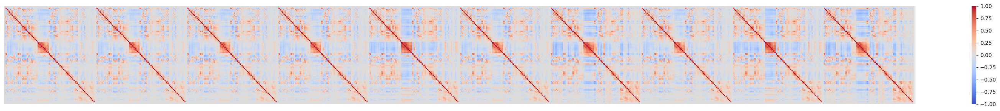

In [119]:
grid = make_grid(decoded_ims[:, None], nrow=10)
plt.figure(figsize=(30,3))
sns.heatmap(grid[0], cmap='coolwarm', vmin=-1, vmax=1)
plt.xticks([])
plt.yticks([])
plt.tight_layout()

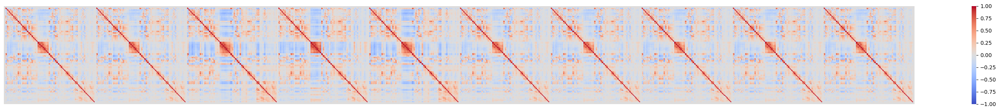

In [120]:
grid = make_grid(decoded_gtzs[:, None], nrow=10)
plt.figure(figsize=(30,3))
sns.heatmap(grid[0], cmap='coolwarm', vmin=-1, vmax=1)
plt.xticks([])
plt.yticks([])
plt.tight_layout()

In [22]:
for i in datailist[:10]:
    print(im_dataset.texts[i][0])

<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN S09-S52-V18 Z47 CN CN CN CN I10-K60 CN CN CN CN CN CN CN N32-Z46 I05-N40 I08-I34-K01-K04-K21-Z90 I34-N47-R33-Y83-Z86
<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN K44-Z72 CN CN CN CN K21 CN CN F32-K52 CN
<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN J45-K80 CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN
<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN O03-Z35 R69 CN CN O02 CN CN CN CN CN CN CN CN CN CN CN
<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN H00 CN CN CN CN CN CN CN CN CN CN
<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN C62-K40 CN CN CN CN CN M17-M23-Z85-Z90 CN CN CN CN CN M67-Z86 L72
<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN G47 CN CN CN CN

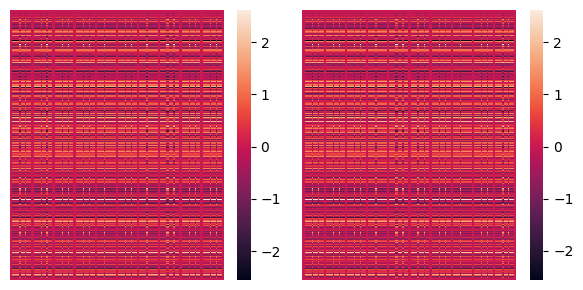

In [17]:
grid = make_grid(gt_zs[:, None].transpose(-1,-2), nrow=10)
fig, axes = plt.subplots(1, 2, figsize=(6,3))
sns.heatmap(grid[0], ax=axes[0])
axes[0].set_xticks([])
axes[0].set_yticks([])

grid = make_grid(pred_zs[:, None].transpose(-1,-2), nrow=10)
sns.heatmap(grid[0], ax=axes[1])
axes[1].set_xticks([])
axes[1].set_yticks([])
plt.tight_layout()

In [1]:
from models.cholesky_ddpm import LatentMLPDiffusion, to_correlation_matrix
device = 'cuda:5'

In [4]:
import torch
model = LatentMLPDiffusion(model_config=diffusion_model_config, num_heads=10, input_shape=[116, 116]).to(device)
model.eval()
# model.load_state_dict({k.replace('module.', ''): v for k,v in torch.load('icd2fc/best_ddpm_ckpt_text_image_cond_clip.pth').items()})
model.load_state_dict(torch.load('icd2fc/best_ddpm_ckpt_text_image_cond_clip.pth'))


<All keys matched successfully>

In [5]:
from dataset.icdfc_dataset import ICDFCDataset, FCICDDataset

im_dataset_cls = {
    # 'mnist': MnistDataset,
    # 'celebhq': CelebDataset,
    'ICDFC': ICDFCDataset,
    'FCICD': FCICDDataset,
}.get(dataset_config['name'])

im_dataset = im_dataset_cls(split='val', preload_embed=True, device='cuda:1', 
                            im_path=dataset_config['im_path'],
                            im_size=dataset_config['im_size'],
                            im_channels=dataset_config['im_channels'],
                            use_latents=False,
                            # latent_path=os.path.join(train_config['task_name'],
                            #                          'SPD'+train_config['vqvae_latent_dir_name']),
                            condition_config=condition_config)
im_dataset[0]

['hariri', 'rest']


prepare data list: 100%|████████████████| 19930/19930 [00:04<00:00, 4982.44it/s]


(tensor([[ 1.0000,  0.6881,  0.1495,  ...,  0.0813, -0.0960, -0.1321],
         [ 0.6881,  1.0000, -0.0223,  ...,  0.1434, -0.1670, -0.1499],
         [ 0.1495, -0.0223,  1.0000,  ..., -0.2401, -0.3572, -0.0718],
         ...,
         [ 0.0813,  0.1434, -0.2401,  ...,  1.0000,  0.3562,  0.2093],
         [-0.0960, -0.1670, -0.3572,  ...,  0.3562,  1.0000,  0.4229],
         [-0.1321, -0.1499, -0.0718,  ...,  0.2093,  0.4229,  1.0000]]),
 {'text': tensor([[-0.6624, -0.3551,  0.5985,  ...,  0.7360, -1.8557, -0.9571],
          [-0.8733, -0.1472,  0.7104,  ...,  0.8140, -2.0123, -0.5302],
          [-0.9011, -0.0425,  0.6464,  ...,  0.7671, -1.9657, -0.5059],
          ...,
          [ 0.2396, -1.7983,  1.1800,  ..., -0.7613, -1.1136, -0.3923],
          [ 0.2396, -1.7983,  1.1800,  ..., -0.7613, -1.1136, -0.3923],
          [ 0.2396, -1.7983,  1.1800,  ..., -0.7613, -1.1136, -0.3923]])})

In [171]:

def sample_prev_timestep(self, xt, noise_pred, t, spd=True):
    r"""
        Use the noise prediction by model to get
        xt-1 using xt and the nosie predicted
    :param xt: current timestep sample
    :param noise_pred: model noise prediction
    :param t: current timestep we are at
    :return:
    """
    x0 = ((xt - (self.sqrt_one_minus_alpha_cum_prod.to(xt.device)[t] * noise_pred)) /
          torch.sqrt(self.alpha_cum_prod.to(xt.device)[t]))
    x0 = torch.clamp(x0, -1., 1.)
    
    mean = xt - ((self.betas.to(xt.device)[t]) * noise_pred) / (self.sqrt_one_minus_alpha_cum_prod.to(xt.device)[t])
    mean = mean / torch.sqrt(self.alphas.to(xt.device)[t])
    # mean = to_correlation_matrix(mean)
    mean = torch.clamp(mean, -1., 1.)
    return mean, x0
    if t == 0:
        return mean, x0
    else:
        variance = (1 - self.alpha_cum_prod.to(xt.device)[t - 1]) / (1.0 - self.alpha_cum_prod.to(xt.device)[t])
        variance = variance * self.betas.to(xt.device)[t]
        sigma = variance ** 0.5
        z = torch.randn(xt.shape).to(xt.device)
        # z = to_correlation_matrix(z)
        # z = torch.ones(xt.shape).to(xt.device)
        # z[:, torch.triu_indices(z.shape[-1], xt.shape[-1])[0], torch.triu_indices(z.shape[-1], xt.shape[-1])[1]] = z[:, torch.tril_indices(z.shape[-1], z.shape[-1])[0], torch.tril_indices(z.shape[-1], z.shape[-1])[1]]
        # z[:, torch.arange(z.shape[-1]), torch.arange(z.shape[-1])] = 0
        # OR
        # variance = self.betas[t]
        # sigma = variance ** 0.5
        # z = torch.randn(xt.shape).to(xt.device)
        return mean + sigma * z, x0

In [8]:
import random
gt_ims = []
decoded_ims = []
datailist = list(range(len(im_dataset)))
random.shuffle(datailist)
datailist = datailist[:10]
########### Sample random noise latent ##########
# For not fixing generation with one sample
N = im_dataset[0][0].shape[0]
xt = torch.randn((10,
                  im_dataset[0][0].shape[0],
                  im_dataset[0][0].shape[1])).to(device)
# xt = to_correlation_matrix(xt)
# xt[:, torch.triu_indices(xt.shape[-1], xt.shape[-1])[0], torch.triu_indices(xt.shape[-1], xt.shape[-1])[1]] = xt[:, torch.tril_indices(xt.shape[-1], xt.shape[-1])[0], torch.tril_indices(xt.shape[-1], xt.shape[-1])[1]]
# xt_in = xt.clone()
xt = xt[:, torch.tril_indices(N, N, -1)[0], torch.tril_indices(N, N, -1)[1]][:, None]

###############################################
cond_input = {
    'text': [],
}
print(datailist)
for datai in datailist:
    cond_input['text'].append(im_dataset[datai][1]['text'].to(device))
    gt_ims.append(im_dataset.images[datai]) # gt image
gt_ims = torch.stack(gt_ims)
cond_input['text'] = torch.stack(cond_input['text'])
################# Sampling Loop ########################
all_x0_pred = []
all_ims = []
all_noise_pred = []
with torch.no_grad():
    for i in tqdm(reversed(range(diffusion_config['num_timesteps']))):
        # Get prediction of noise
        t = (torch.ones((xt.shape[0],)) * i).long().to(device)
        noise_pred_cond = model(xt, t, cond_input=cond_input)
        
        # if cf_guidance_scale > 1:
        #     noise_pred_uncond = model(xt, t, uncond_input)
        #     noise_pred = noise_pred_uncond + cf_guidance_scale * (noise_pred_cond - noise_pred_uncond)
        # else:
        noise_pred = noise_pred_cond
        
        # Use scheduler to get x0 and xt-1
        xt, x0_pred = scheduler.sample_prev_timestep(xt, noise_pred, torch.as_tensor(i).to(device), spd=False)
        # xt = to_correlation_matrix(xt)
        
        # if i > 0: # get prev noisy img diag values
        #     empty_im = torch.zeros_like(gt_ims).to(device)
        #     empty_im[:, torch.arange(xt.shape[-1]), torch.arange(xt.shape[-1])] = 1
        #     empty_noise = to_correlation_matrix(torch.randn_like(empty_im).to(device))
        #     empty_noisy_im = scheduler.add_noise(empty_im, empty_noise, t-1)
        #     diag = empty_noisy_im[:, torch.arange(xt.shape[-1]), torch.arange(xt.shape[-1])]
        # else:
        #     diag = 1
            
        # xt[:, torch.arange(xt.shape[-1]), torch.arange(xt.shape[-1])] = diag
        # x0_pred[:, torch.arange(xt.shape[-1]), torch.arange(xt.shape[-1])] = diag

        # Save x0
        if i == 0:
            # Decode ONLY the final image to save time
            ims = xt
        else:
            ims = x0_pred
        
        # ims = torch.clamp(ims, -1., 1.).detach().cpu()
        # ims = (ims + 1) / 2
        all_x0_pred.append(x0_pred)
        all_ims.append(ims)
        all_noise_pred.append(noise_pred)
        # break

decoded_ims = all_ims[-1]

[2800, 4283, 1189, 40, 273, 2139, 4277, 2391, 1703, 3376]


1000it [02:50,  5.86it/s]


In [19]:
fc = torch.zeros(len(decoded_ims), N, N).to(device)
fc[:, torch.tril_indices(N, N, -1)[0], torch.tril_indices(N, N, -1)[1]] = decoded_ims.squeeze()
fc[:, torch.triu_indices(N, N, 1)[0], torch.triu_indices(N, N, 1)[1]] = decoded_ims.squeeze()

fc.shape

torch.Size([10, 116, 116])

In [21]:
import matplotlib.pyplot as plt
import seaborn as sns

In [170]:
xt_in[0, 0, 2], xt_in[0, 2, 0]

(tensor(0.3542, device='cuda:5'), tensor(-0.8569, device='cuda:5'))

<Axes: >

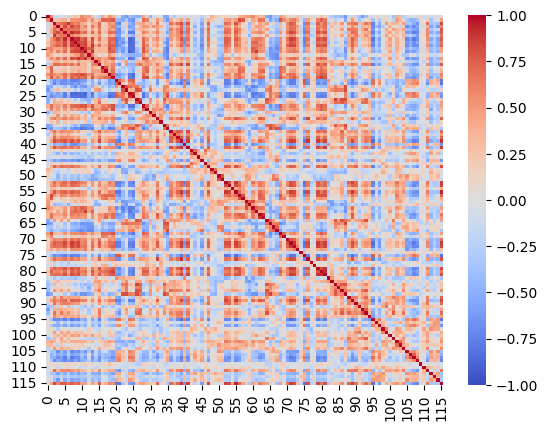

In [23]:
sns.heatmap(gt_ims[0], cmap='coolwarm', vmin=-1, vmax=1)


## SPD-VQVAE (pred L)

In [28]:
L_gt = torch.load('icd2fc/train_cholesky_gt.pth')
L_gt.shape

torch.Size([34785, 116, 116])

In [29]:
L_gt.max(), L_gt.min()

(tensor(1.0000), tensor(-0.9986))

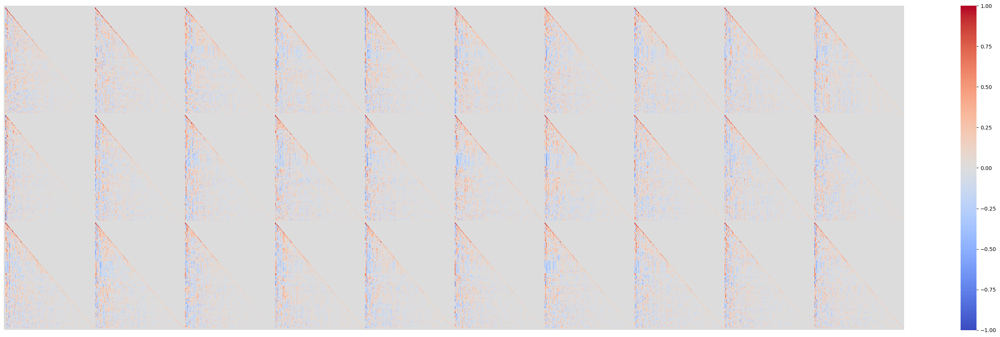

In [30]:
grid = make_grid(L_gt[:30, None], nrow=10)
plt.figure(figsize=(30,9))
sns.heatmap(grid[0], cmap='coolwarm', vmin=-1, vmax=1)
plt.xticks([])
plt.yticks([])
plt.tight_layout()

In [34]:
L_gt[:30].shape

torch.Size([30, 116, 116])

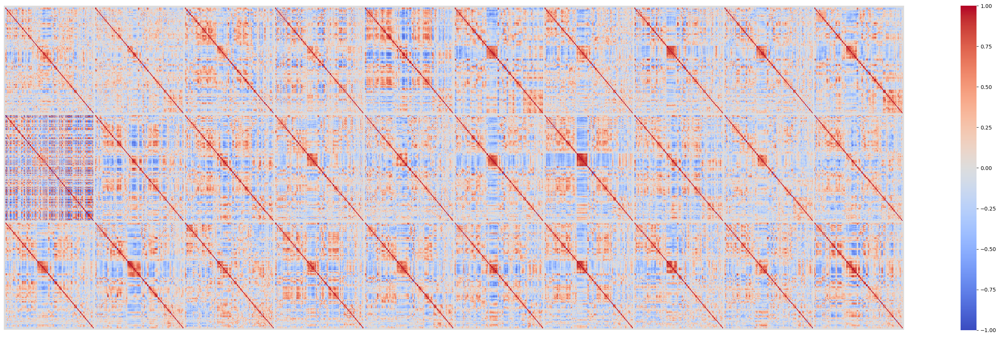

In [35]:
grid = make_grid(torch.bmm(L_gt[:30], L_gt[:30].transpose(-1, -2))[:, None], nrow=10)
plt.figure(figsize=(30,9))
sns.heatmap(grid[0], cmap='coolwarm', vmin=-1, vmax=1)
plt.xticks([])
plt.yticks([])
plt.tight_layout()

In [85]:
from models.vqvae import VQVAE, SPD_VQVAE

vae = SPD_VQVAE(input_dim=dataset_config['im_size'],
                              model_config=autoencoder_config).to(device)
vae.load_state_dict(torch.load(os.path.join(train_config['task_name'],
                                                'SPD_reconL_noreconM'+train_config['vqvae_autoencoder_ckpt_name']),
                                 map_location=device))
vae.eval()
vae

SPD_VQVAE(
  (encoder_body): Sequential(
    (0): Linear(in_features=13456, out_features=512, bias=True)
    (1): BatchNorm1d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): SiLU()
    (3): Linear(in_features=512, out_features=256, bias=True)
    (4): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): SiLU()
    (6): Linear(in_features=256, out_features=128, bias=True)
    (7): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): SiLU()
  )
  (encoder_out): Linear(in_features=128, out_features=4096, bias=True)
  (embedding): Embedding(8192, 256)
  (decoder_body): Sequential(
    (0): Linear(in_features=4096, out_features=128, bias=True)
    (1): BatchNorm1d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): SiLU()
    (3): Linear(in_features=128, out_features=256, bias=True)
    (4): BatchNorm1d(256, eps=1e-05, momentum=0.1, affine=True, track_running_sta

In [52]:

im_dataset = im_dataset_cls(split='train', use_latents=False,
                            im_path=dataset_config['im_path'],
                            im_size=dataset_config['im_size'],
                            im_channels=dataset_config['im_channels'])

['hariri', 'rest']


prepare data list: 100%|████████████████| 19930/19930 [00:14<00:00, 1410.25it/s]


In [86]:

cholesky_gts = []
cholesky_preds = []
# decoded_gtzs = []
gt_ims = []
pred_ims = []
datailist = list(range(len(im_dataset)))
random.shuffle(datailist)
for datai in datailist[:30]:
    im, cholesky_gt = im_dataset[datai]
    gt_ims.append(im)
    im = im[None].to(device)
    outputs = vae(im)
    output, z, quantize_losses, L_pred = outputs
    pred_ims.append(output)
    cholesky_preds.append(L_pred)
    cholesky_gts.append(cholesky_gt)

In [87]:
gt_ims = torch.stack(gt_ims).detach().cpu()
pred_ims = torch.cat(pred_ims).detach().cpu()
cholesky_preds = torch.cat(cholesky_preds).detach().cpu()
cholesky_gts = torch.stack(cholesky_gts).detach().cpu()

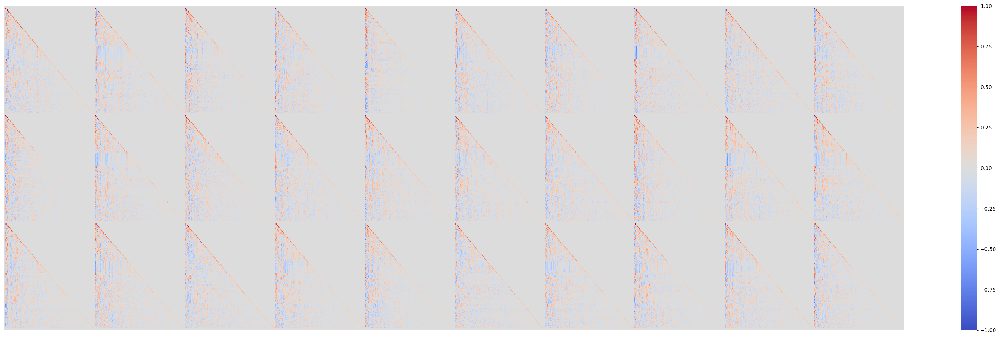

In [88]:
grid = make_grid(cholesky_gts[:, None], nrow=10)
plt.figure(figsize=(30,9))
sns.heatmap(grid[0], cmap='coolwarm', vmin=-1, vmax=1)
plt.xticks([])
plt.yticks([])
plt.tight_layout()

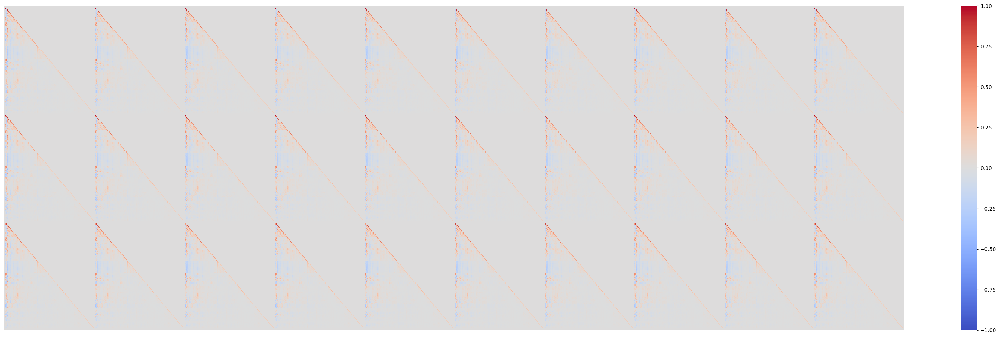

In [89]:
grid = make_grid(cholesky_preds[:, None], nrow=10)
plt.figure(figsize=(30,9))
sns.heatmap(grid[0], cmap='coolwarm', vmin=-1, vmax=1)
plt.xticks([])
plt.yticks([])
plt.tight_layout()

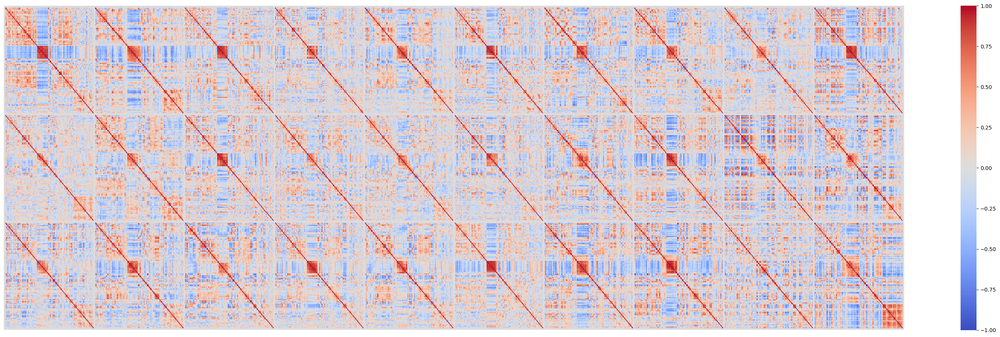

In [90]:
grid = make_grid(gt_ims[:, None], nrow=10)
plt.figure(figsize=(30,9))
sns.heatmap(grid[0], cmap='coolwarm', vmin=-1, vmax=1)
plt.xticks([])
plt.yticks([])
plt.tight_layout()

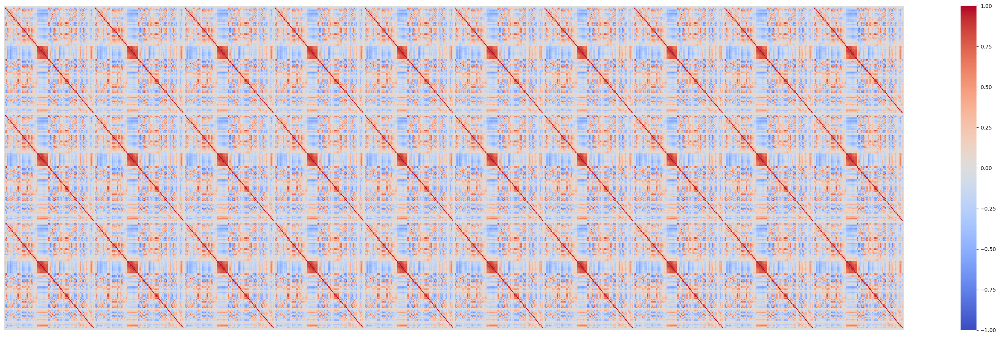

In [91]:
grid = make_grid(pred_ims, nrow=10)
plt.figure(figsize=(30,9))
sns.heatmap(grid[0], cmap='coolwarm', vmin=-1, vmax=1)
plt.xticks([])
plt.yticks([])
plt.tight_layout()

<Axes: >

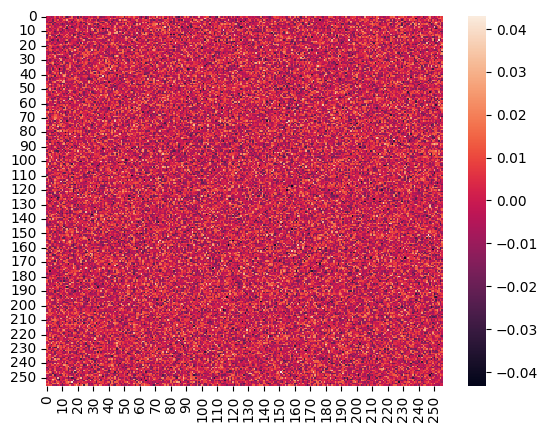

In [98]:
corrcoef = torch.corrcoef(vae.embedding.weight.T).detach().cpu()
corrcoef[torch.arange(len(corrcoef)), torch.arange(len(corrcoef))] = 0
sns.heatmap(corrcoef)

## VQVAE (pred FC)

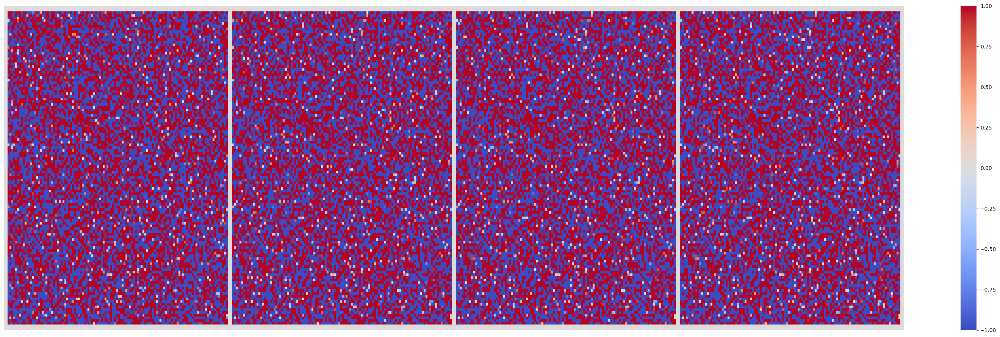

In [164]:
grid = make_grid(torch.stack(all_ims)[::33, 0:1].detach().cpu(), nrow=10)
plt.figure(figsize=(30,9))
sns.heatmap(grid[0], cmap='coolwarm', vmin=-1, vmax=1)
plt.xticks([])
plt.yticks([])
plt.tight_layout()

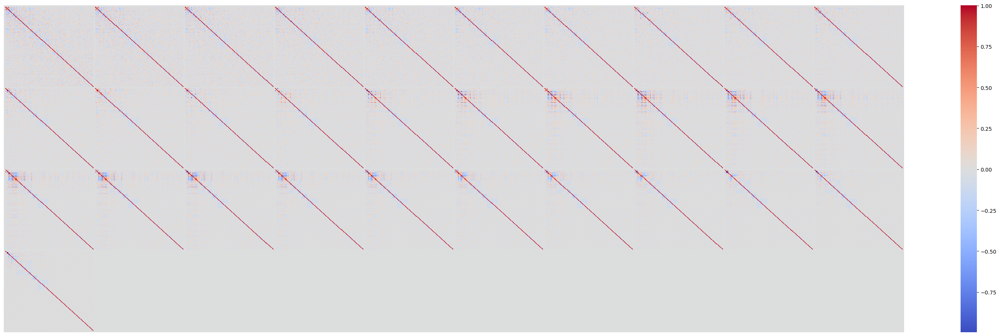

In [144]:
grid = make_grid(torch.stack(all_noise_pred)[::33, 0:1].detach().cpu(), nrow=10)
plt.figure(figsize=(30,9))
sns.heatmap(grid[0], cmap='coolwarm')
plt.xticks([])
plt.yticks([])
plt.tight_layout()

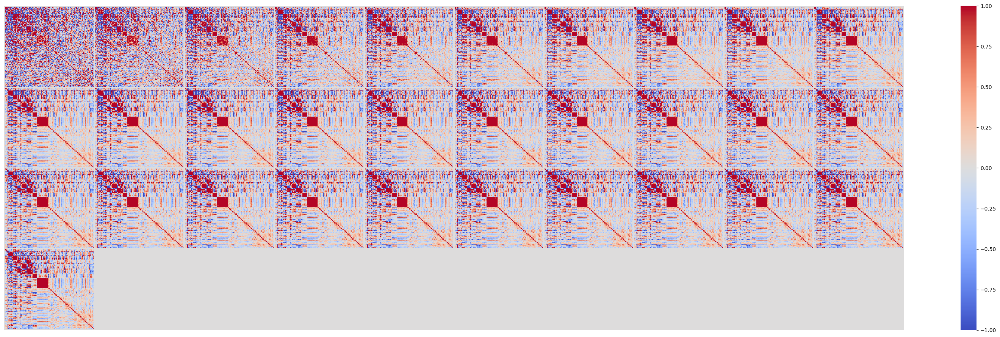

In [145]:
grid = make_grid(torch.stack(all_x0_pred)[::33, 0:1].detach().cpu(), nrow=10)
plt.figure(figsize=(30,9))
sns.heatmap(grid[0], cmap='coolwarm', vmin=-1, vmax=1)
plt.xticks([])
plt.yticks([])
plt.tight_layout()

In [69]:
decoded_ims = decoded_ims.squeeze().detach().cpu()

In [70]:
decoded_ims.shape

torch.Size([10, 116, 116])

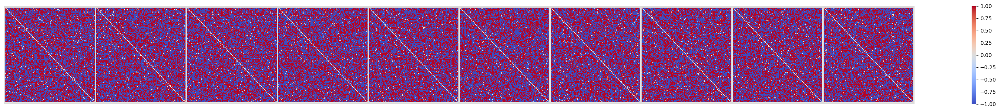

In [25]:
grid = make_grid(fc[:, None].cpu(), nrow=10)
plt.figure(figsize=(30,3))
sns.heatmap(grid[0], cmap='coolwarm', vmin=-1, vmax=1)
plt.xticks([])
plt.yticks([])
plt.tight_layout()

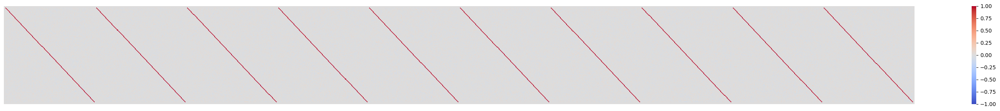

In [71]:
grid = make_grid(decoded_ims[:, None], nrow=10)
plt.figure(figsize=(30,3))
sns.heatmap(grid[0], cmap='coolwarm', vmin=-1, vmax=1)
plt.xticks([])
plt.yticks([])
plt.tight_layout()

In [22]:
for i in datailist[:10]:
    print(im_dataset.texts[i][0])

<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN S09-S52-V18 Z47 CN CN CN CN I10-K60 CN CN CN CN CN CN CN N32-Z46 I05-N40 I08-I34-K01-K04-K21-Z90 I34-N47-R33-Y83-Z86
<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN K44-Z72 CN CN CN CN K21 CN CN F32-K52 CN
<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN J45-K80 CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN
<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN O03-Z35 R69 CN CN O02 CN CN CN CN CN CN CN CN CN CN CN
<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN H00 CN CN CN CN CN CN CN CN CN CN
<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN C62-K40 CN CN CN CN CN M17-M23-Z85-Z90 CN CN CN CN CN M67-Z86 L72
<|startoftext|> CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN CN G47 CN CN CN CN